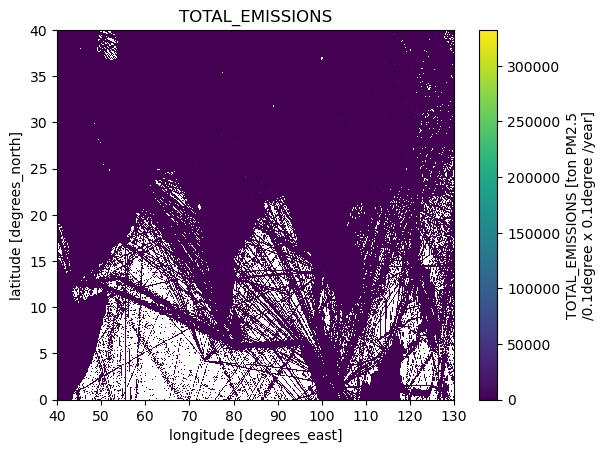

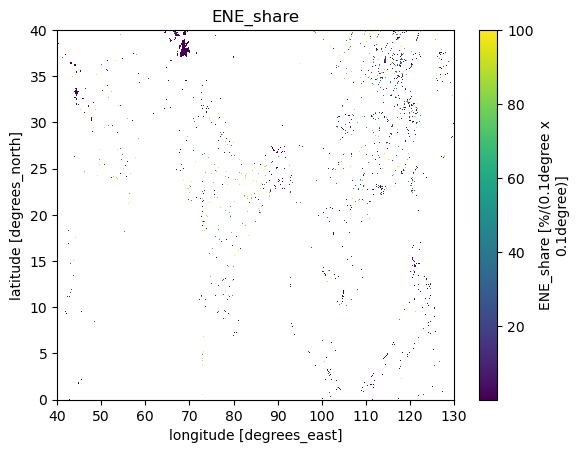

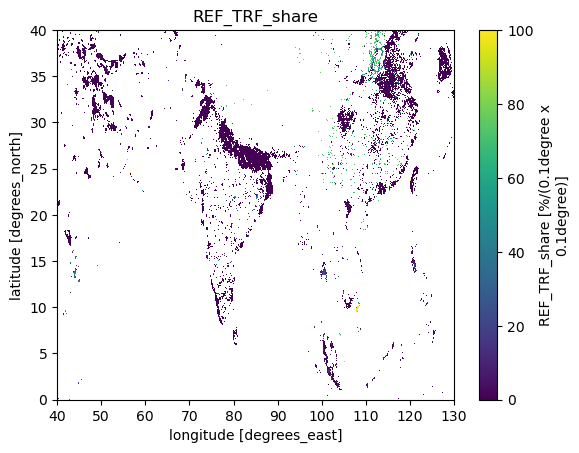

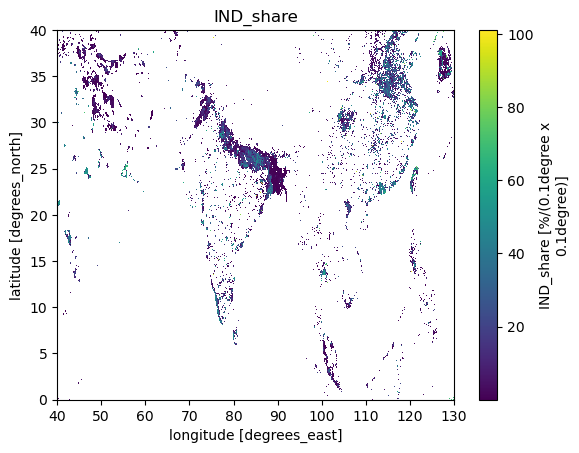

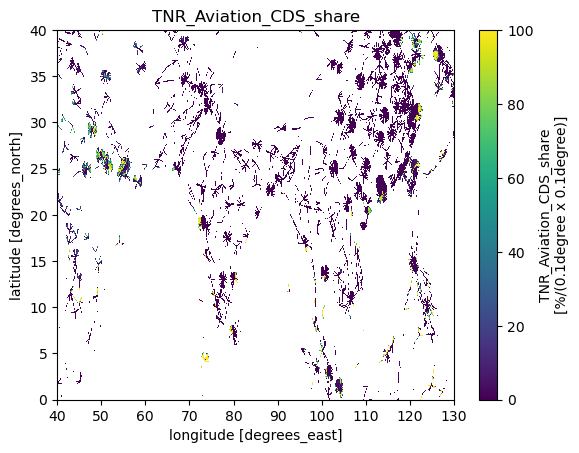

...

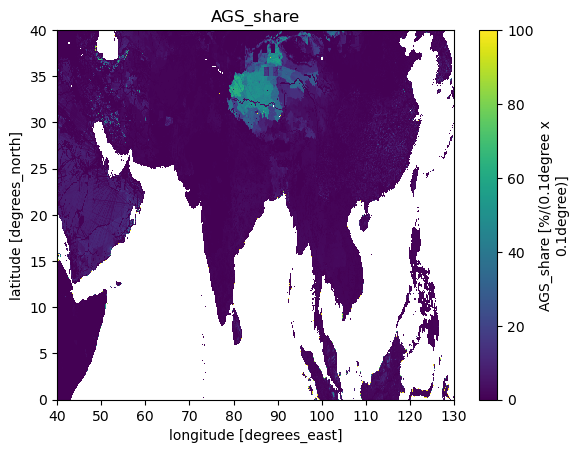

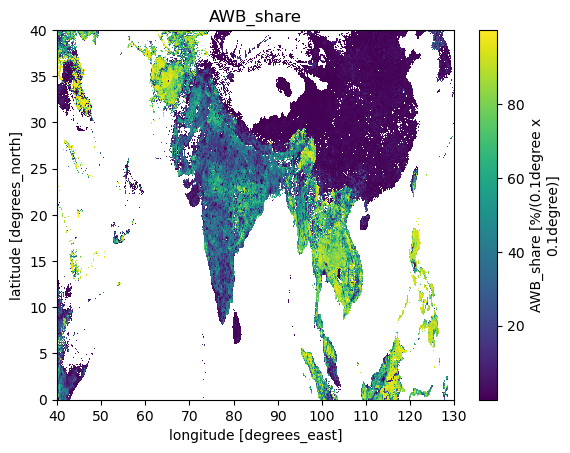

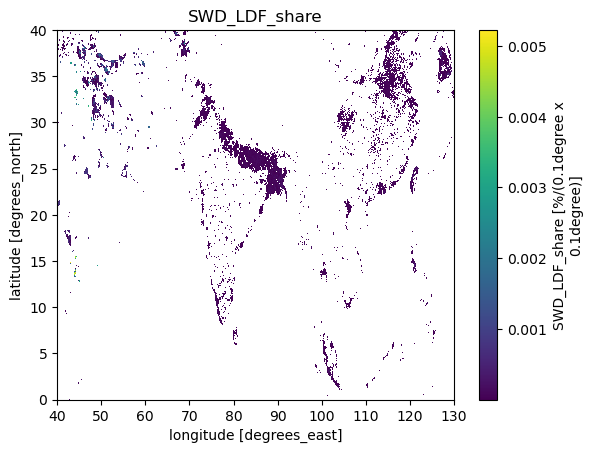

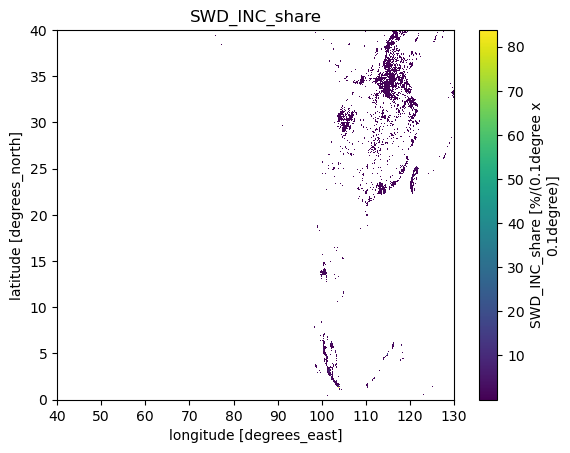

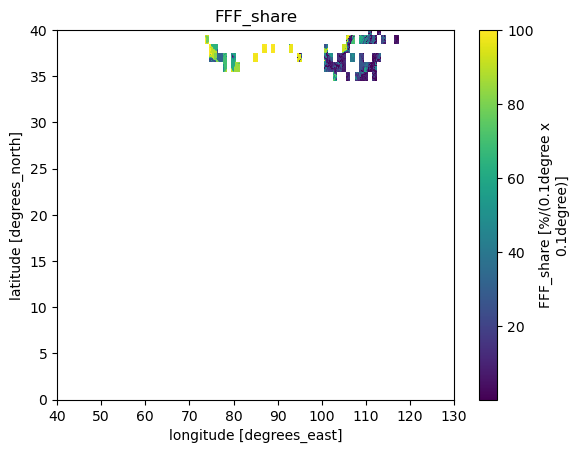

In [37]:
import xarray as xr
import matplotlib.pyplot as plt

# Open the NetCDF file
nc_data = xr.open_dataset('G:\\LSTM_ENSO\\v432_PM2.5_2012_shares\\v432_PM2.5_shares_2012_subset.nc', engine='netcdf4')

# Get a list of all variables
variables = [var for var in nc_data.variables if var not in ['lat', 'lon']]

# Plot each variable
for variable in variables:
    # Plot the variable
    nc_data[variable].plot()
    # Add a title with the variable name
    plt.title(variable)
    # Show the plot
    plt.show()


C:\Users\Subhadeep Maishal\AppData\Local\Temp\ipykernel_13400\1626888730.py:12: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


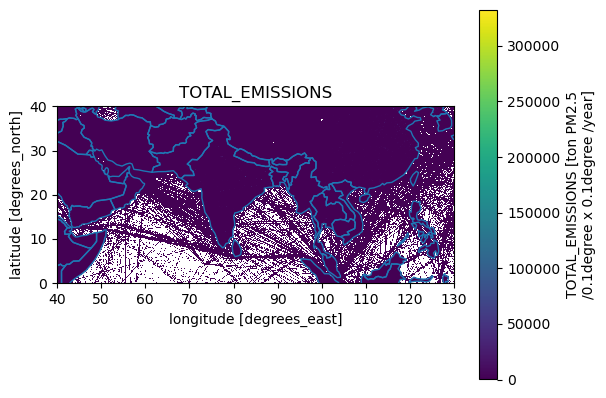

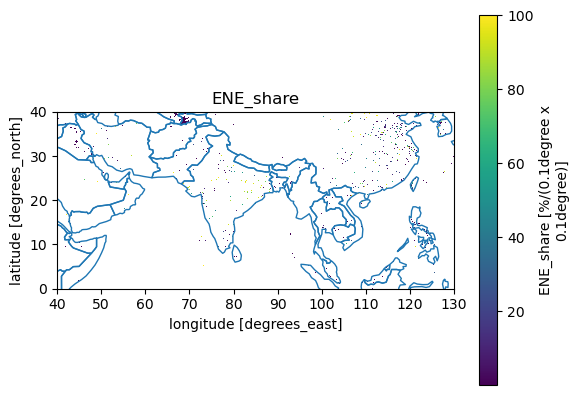

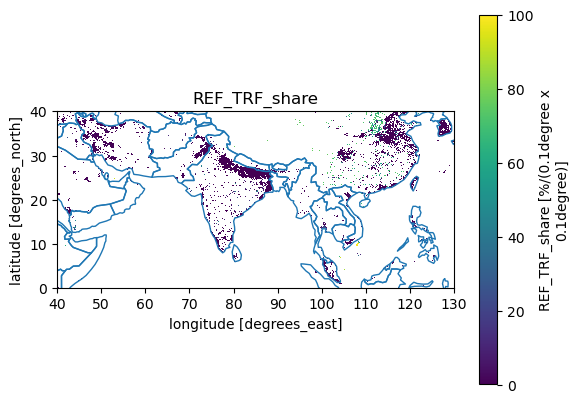

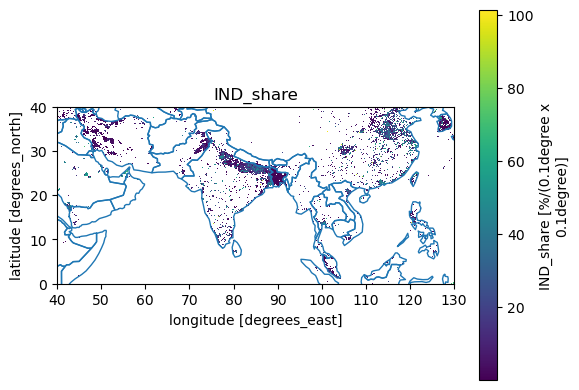

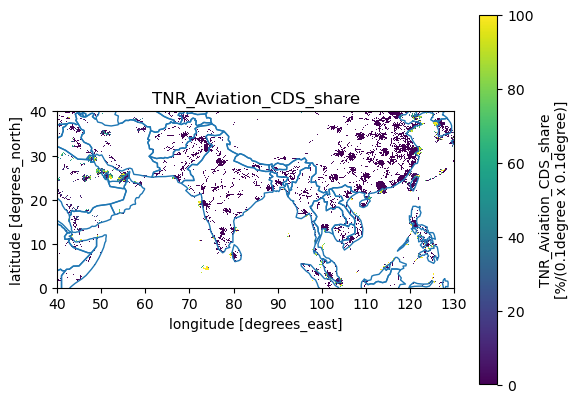

...

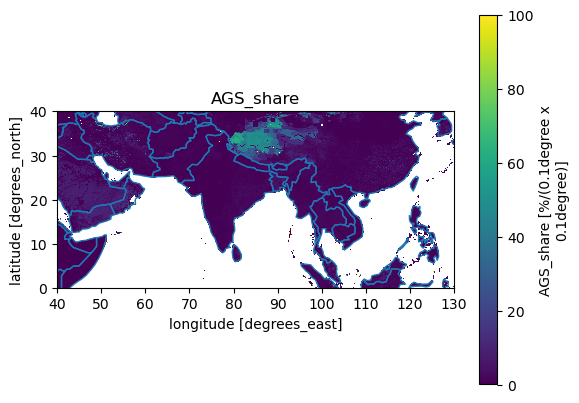

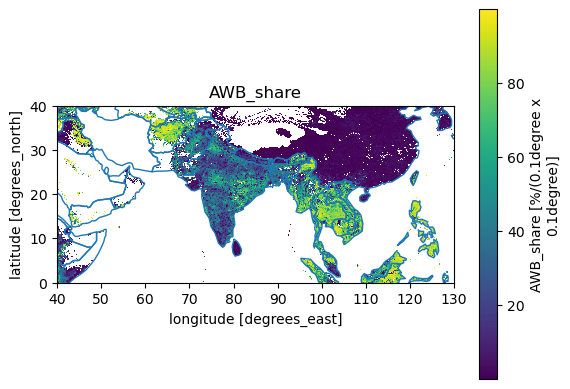

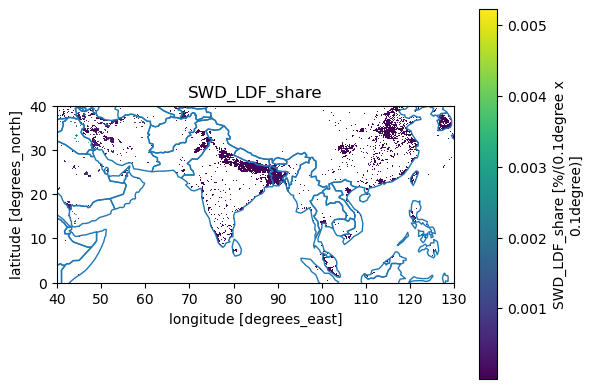

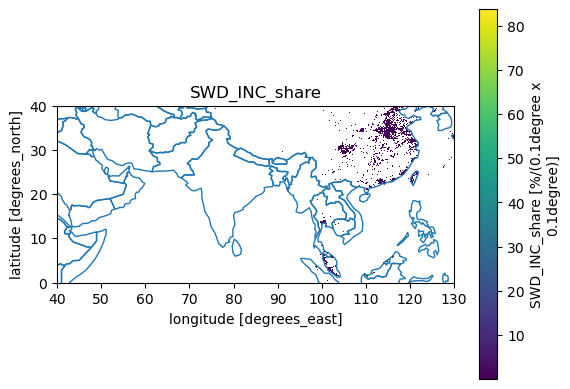

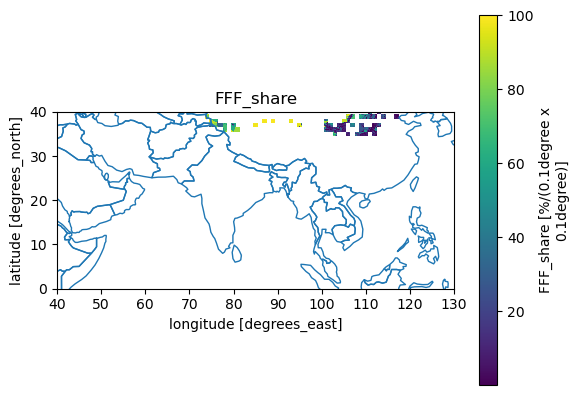

In [39]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd

# Open the NetCDF file
nc_data = xr.open_dataset('G:\\LSTM_ENSO\\v432_PM2.5_2012_shares\\v432_PM2.5_shares_2012_subset.nc', engine='netcdf4')

# Get a list of all variables
variables = [var for var in nc_data.variables if var not in ['lat', 'lon']]

# Load country boundaries shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plot each variable
for variable in variables:
    # Plot the variable
    nc_data[variable].plot()
    
    # Add country boundaries
    world.boundary.plot(ax=plt.gca(), linewidth=1)

    # Add a title with the variable name
    plt.title(variable)
    
    # Show the plot
    plt.show()


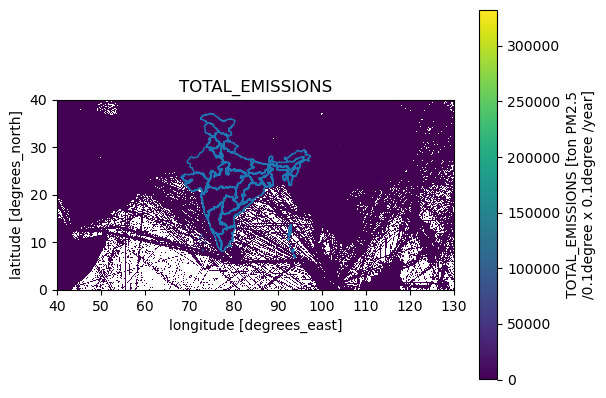

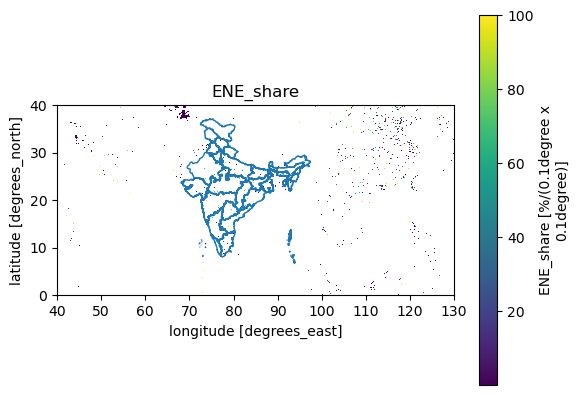

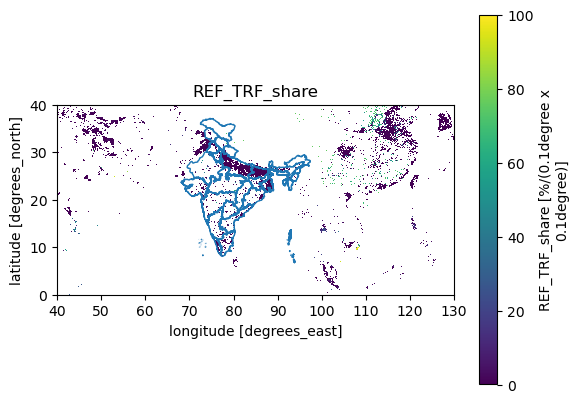

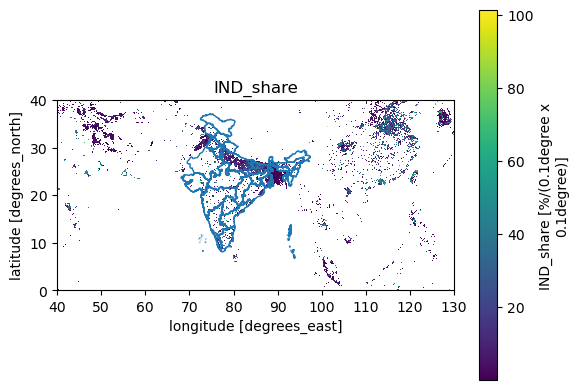

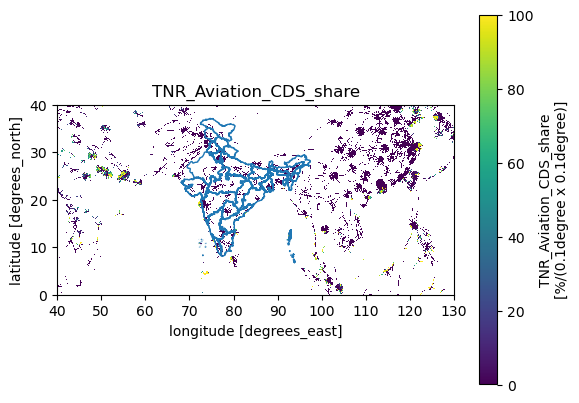

...

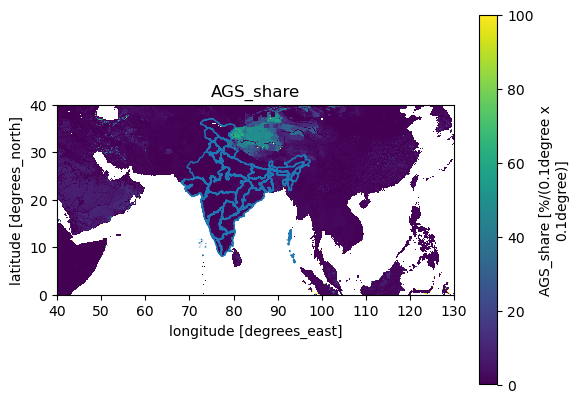

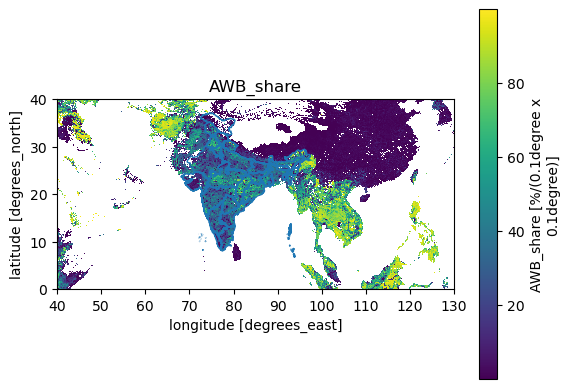

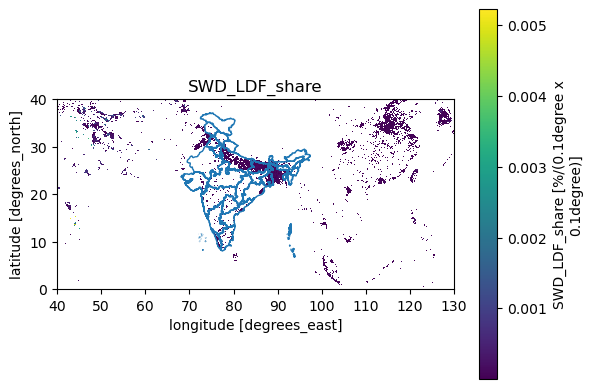

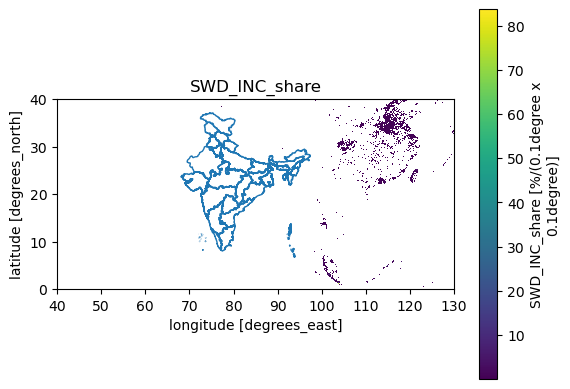

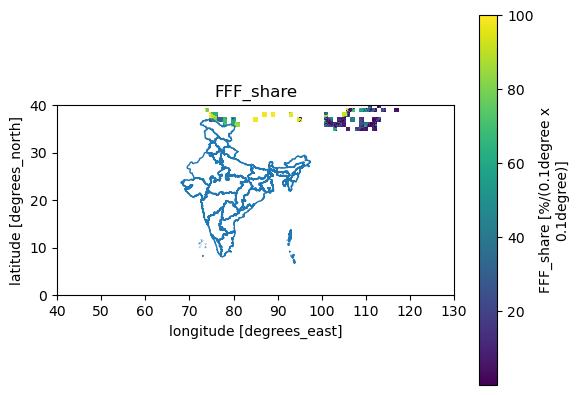

In [40]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd

# Step 1: Open the NetCDF file
nc_data = xr.open_dataset('G:\\LSTM_ENSO\\v432_PM2.5_2012_shares\\v432_PM2.5_shares_2012_subset.nc', engine='netcdf4')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)
nc_crs = 'EPSG:4326'  # Assuming the data is in WGS 84 (EPSG:4326)
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Get a list of all variables
variables = [var for var in nc_data.variables if var not in ['lat', 'lon']]

# Step 4: Plot each variable
for variable in variables:
    # Create a new figure
    fig, ax = plt.subplots()
    
    # Plot the variable
    nc_data[variable].plot(ax=ax)

    # Add country boundaries
    india_shape.boundary.plot(ax=ax, linewidth=1)

    # Add a title with the variable name
    ax.set_title(variable)
    
    # Show the plot
    plt.show()


In [47]:
import xarray as xr
import geopandas as gpd
import rioxarray  # Importing rioxarray for clipping
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the NetCDF file
nc_data = xr.open_dataset('G:\\LSTM_ENSO\\v432_PM2.5_2012_shares\\v432_PM2.5_shares_2012_subset.nc', engine='netcdf4')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_Country_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)
nc_crs = 'EPSG:4326'  # Assuming the data is in WGS 84 (EPSG:4326)
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Set CRS for the data variable
nc_data.rio.write_crs(nc_crs, inplace=True)

# Step 4: Clip the NetCDF data using the shapefile
nc_data_clipped = nc_data.rio.clip(india_shape.geometry.apply(mapping), crs=nc_crs)

# Step 5: Save the clipped data to a new NetCDF file
output_file = 'G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc'
nc_data_clipped.to_netcdf(output_file)


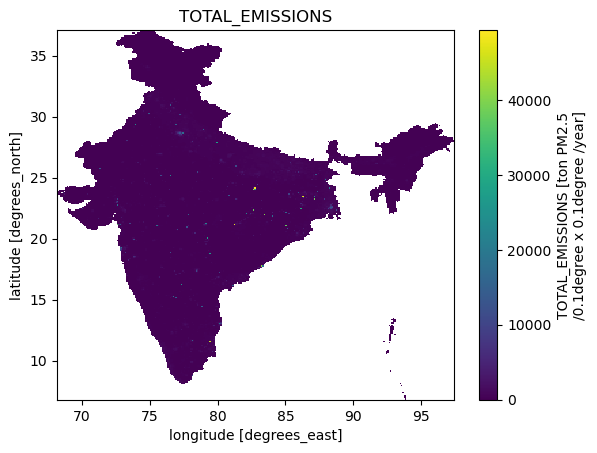

In [49]:
import xarray as xr
import matplotlib.pyplot as plt

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 3: Plot the TOTAL_EMISSIONS variable
fig, ax = plt.subplots()
total_emissions.plot(ax=ax)
ax.set_title('TOTAL_EMISSIONS')
plt.show()


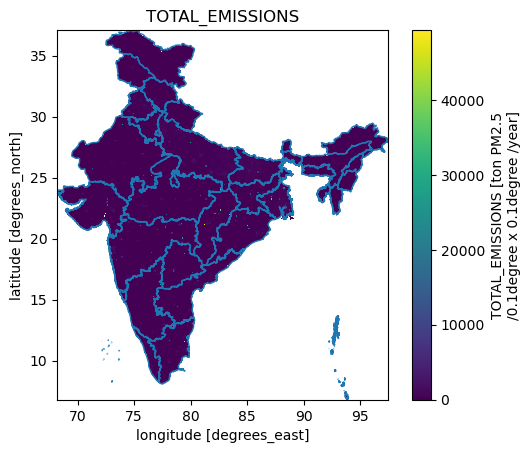

In [50]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import rioxarray  # Importing rioxarray for clipping
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)

# Manually specify the CRS based on your knowledge
# For example, assuming the data is in WGS 84 (EPSG:4326)
nc_crs = 'EPSG:4326'

# Reproject the shapefile to match the CRS of the NetCDF data
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 4: Plot the TOTAL_EMISSIONS variable
fig, ax = plt.subplots()
total_emissions.plot(ax=ax)

# Add country boundaries
india_shape.boundary.plot(ax=ax, linewidth=1)

ax.set_title('TOTAL_EMISSIONS')

plt.show()


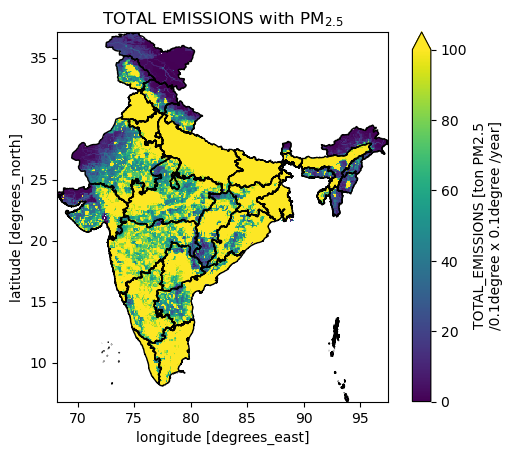

In [59]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import rioxarray  # Importing rioxarray for clipping
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)

# Manually specify the CRS based on your knowledge
# For example, assuming the data is in WGS 84 (EPSG:4326)
nc_crs = 'EPSG:4326'

# Reproject the shapefile to match the CRS of the NetCDF data
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 4: Plot the TOTAL_EMISSIONS variable
fig, ax = plt.subplots()
total_emissions.plot(ax=ax, vmin=0, vmax=100)  # Setting vmin and vmax for color scale

# Add country boundaries in black color
india_shape.boundary.plot(ax=ax, linewidth=1, color='black')

# Set title with subscript "2.5" in "PM2.5"
ax.set_title('TOTAL EMISSIONS with PM$_{2.5}$')

plt.show()


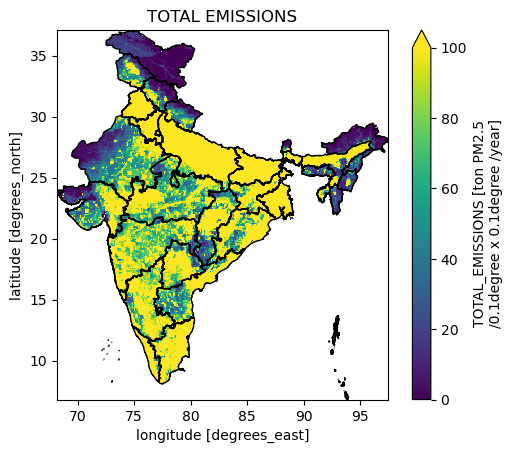

In [63]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import rioxarray  # Importing rioxarray for clipping
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)

# Manually specify the CRS based on your knowledge
# For example, assuming the data is in WGS 84 (EPSG:4326)
nc_crs = 'EPSG:4326'

# Reproject the shapefile to match the CRS of the NetCDF data
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 4: Plot the TOTAL_EMISSIONS variable
fig, ax = plt.subplots()
im = total_emissions.plot(ax=ax, vmin=0, vmax=100)  # Setting vmin and vmax for color scale

# Add country boundaries in black color
india_shape.boundary.plot(ax=ax, linewidth=1, color='black')

# Set title with the unit for total emissions
ax.set_title('TOTAL EMISSIONS')

# Create colorbar with the unit for total emissions
#cbar = fig.colorbar(im, ax=ax)
#cbar.set_label('Emissions (kg/year)')

plt.show()


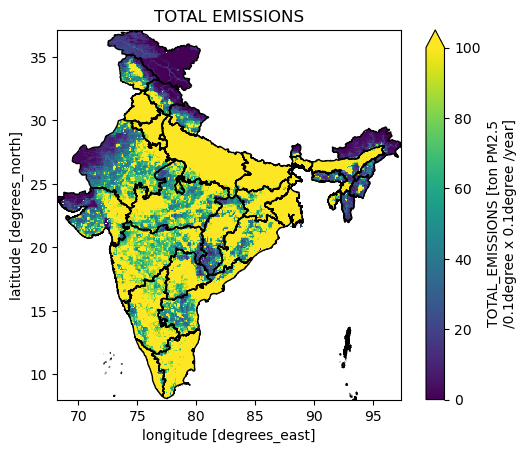

In [69]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)

# Manually specify the CRS based on your knowledge
# For example, assuming the data is in WGS 84 (EPSG:4326)
nc_crs = 'EPSG:4326'

# Reproject the shapefile to match the CRS of the NetCDF data
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 4: Slice the data along the latitude and longitude ranges
# Step 4: Slice the data along the latitude and longitude ranges
lat_range = slice(8, 38)  # Latitude range from 8 to 38
lon_range = slice(67, 98)  # Longitude range from 67 to 98
total_emissions_sliced = total_emissions.sel(lat=lat_range, lon=lon_range)


# Step 5: Plot the sliced TOTAL_EMISSIONS variable
fig, ax = plt.subplots()
im = total_emissions_sliced.plot(ax=ax, vmin=0, vmax=100)  # Setting vmin and vmax for color scale

# Add country boundaries in black color
india_shape.boundary.plot(ax=ax, linewidth=1, color='black')

# Set title with the unit for total emissions
ax.set_title('TOTAL EMISSIONS')

plt.show()


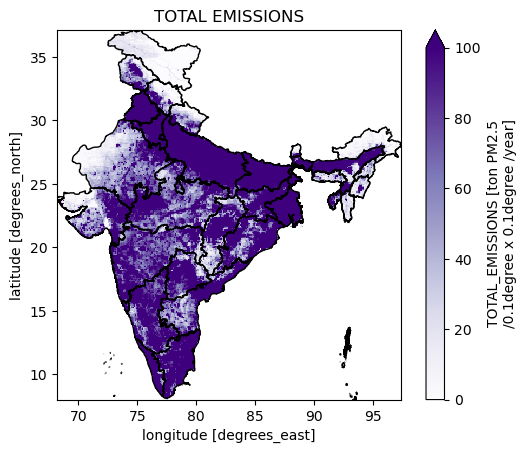

In [71]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Step 2: Load and reproject the shapefile to match the CRS of the NetCDF data
shapefile_path = r'C:/Users/Subhadeep Maishal/Music/JUP/Breathe/India-State/shp/India_State_Boundary.shp'
india_shape = gpd.read_file(shapefile_path)

# Manually specify the CRS based on your knowledge
# For example, assuming the data is in WGS 84 (EPSG:4326)
nc_crs = 'EPSG:4326'

# Reproject the shapefile to match the CRS of the NetCDF data
india_shape = india_shape.to_crs(nc_crs)

# Step 3: Extract the TOTAL_EMISSIONS variable
total_emissions = clipped_data['TOTAL_EMISSIONS']

# Step 4: Slice the data along the latitude and longitude ranges
lat_range = slice(8, 38)  # Latitude range from 8 to 38
lon_range = slice(67, 98)  # Longitude range from 67 to 98
total_emissions_sliced = total_emissions.sel(lat=lat_range, lon=lon_range)

# Step 5: Plot the sliced TOTAL_EMISSIONS variable with a different colormap
fig, ax = plt.subplots()
im = total_emissions_sliced.plot(ax=ax, vmin=0, vmax=100, cmap='Purples')  # Setting vmin and vmax for color scale

# Add country boundaries in black color
india_shape.boundary.plot(ax=ax, linewidth=1, color='black')

# Set title with the unit for total emissions
ax.set_title('TOTAL EMISSIONS')

plt.show()



In [95]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import mapping  # Importing mapping function

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')


In [98]:
# Compute the mean value of each variable
mean_values = clipped_data.mean(dim=['lat', 'lon'])

# Print the mean values
print(mean_values)


<xarray.Dataset>
Dimensions:                 ()
Data variables: (12/25)
    spatial_ref             float64 0.0
    TOTAL_EMISSIONS         float32 215.4
    ENE_share               float32 47.59
    REF_TRF_share           float32 1.525
    IND_share               float32 17.65
    TNR_Aviation_CDS_share  float32 0.0864
    ...                      ...
    MNM_share               float32 0.3221
    AGS_share               float32 0.8312
    AWB_share               float32 32.47
    SWD_LDF_share           float32 5.349e-05
    SWD_INC_share           float32 nan
    FFF_share               float32 50.31


In [100]:
# Convert mean values to a pandas DataFrame
mean_values_df = mean_values.to_dataframe()

# Save the DataFrame to a CSV file
mean_values_df.to_csv(r'G:\#PM25_MODI\csv\mean_values.csv')



ValueError: no valid index for a 0-dimensional object

In [110]:
import pandas as pd

# Initialize an empty list to store DataFrames
dfs = []

# Iterate over each data variable
for var_name in mean_values.data_vars:
    # Check if the variable is a scalar
    if mean_values[var_name].ndim == 0:
        # Create a DataFrame with a single row
        var_df = pd.DataFrame({var_name: [mean_values[var_name].item()]})
        dfs.append(var_df)

# Concatenate the DataFrames
combined_df = pd.concat(dfs, axis=1)

# Save the combined DataFrame to a CSV file
combined_df.to_csv(r'G:\#PM25_MODI\csv\mean_values.csv', index=False)


In [111]:
print(combined_df)


   spatial_ref  TOTAL_EMISSIONS  ENE_share  REF_TRF_share  IND_share  \
0          0.0       215.370697  47.587822       1.525028  17.649855   

   TNR_Aviation_CDS_share  TNR_Aviation_CRS_share  TNR_Aviation_LTO_share  \
0                0.086399                0.185493                0.034776   

   TRO_share  TNR_Other_share  ...  IRO_share  NFE_share  FOO_PAP_share  \
0   7.711581         1.690996  ...   2.223093   2.684723       0.037354   

   PRU_SOL_share  MNM_share  AGS_share  AWB_share  SWD_LDF_share  \
0        0.00021   0.322139    0.83119  32.466312       0.000053   

   SWD_INC_share  FFF_share  
0            NaN  50.310688  

[1 rows x 25 columns]


In [112]:
import xarray as xr
import pandas as pd

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Compute the mean value of each variable
mean_values = clipped_data.mean(dim=['lat', 'lon'])

# Initialize an empty list to store DataFrames
dfs = []

# Iterate over each data variable
for var_name in mean_values.data_vars:
    # Check if the variable is a scalar
    if mean_values[var_name].ndim == 0:
        # Create a DataFrame with a single row
        var_df = pd.DataFrame({var_name: [mean_values[var_name].item()]})
        dfs.append(var_df)

# Concatenate the DataFrames
combined_df = pd.concat(dfs, axis=1)

# Save the combined DataFrame to a CSV file
combined_df.to_csv(r'G:\#PM25_MODI\csv\mean_values.csv', index=False)

print("CSV file saved successfully.")


CSV file saved successfully.


In [113]:
import xarray as xr
import pandas as pd

# Step 1: Open the clipped NetCDF file
clipped_data = xr.open_dataset('G:/LSTM_ENSO/v432_PM2.5_2012_shares/clipped_data.nc')

# Compute the sum value of each variable
sum_values = clipped_data.sum(dim=['lat', 'lon'])

# Initialize an empty list to store DataFrames
dfs = []

# Iterate over each data variable
for var_name in sum_values.data_vars:
    # Check if the variable is a scalar
    if sum_values[var_name].ndim == 0:
        # Create a DataFrame with a single row
        var_df = pd.DataFrame({var_name: [sum_values[var_name].item()]})
        dfs.append(var_df)

# Concatenate the DataFrames
combined_df = pd.concat(dfs, axis=1)

# Save the combined DataFrame to a CSV file
combined_df.to_csv(r'G:\#PM25_MODI\csv\sum_values.csv', index=False)

print("CSV file saved successfully.")


CSV file saved successfully.


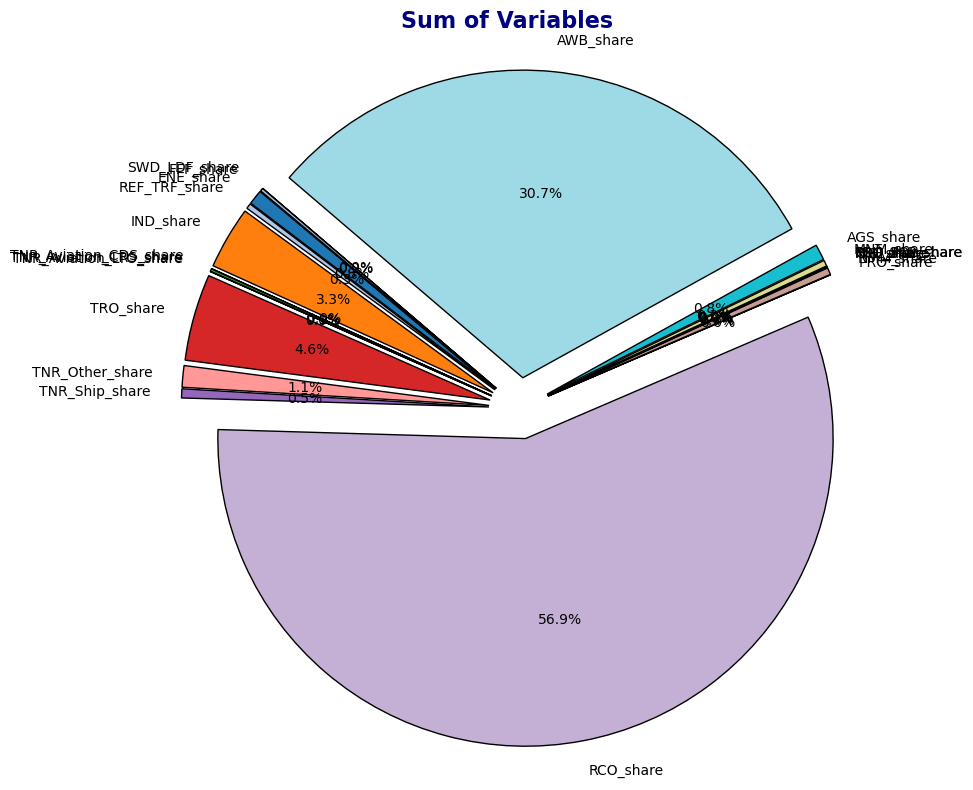

In [115]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart with custom styling
plt.figure(figsize=(10, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
plt.pie(sum_values_df.iloc[0], labels=sum_values_df.columns, autopct='%1.1f%%', startangle=140,
        colors=colors, explode=explode, wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


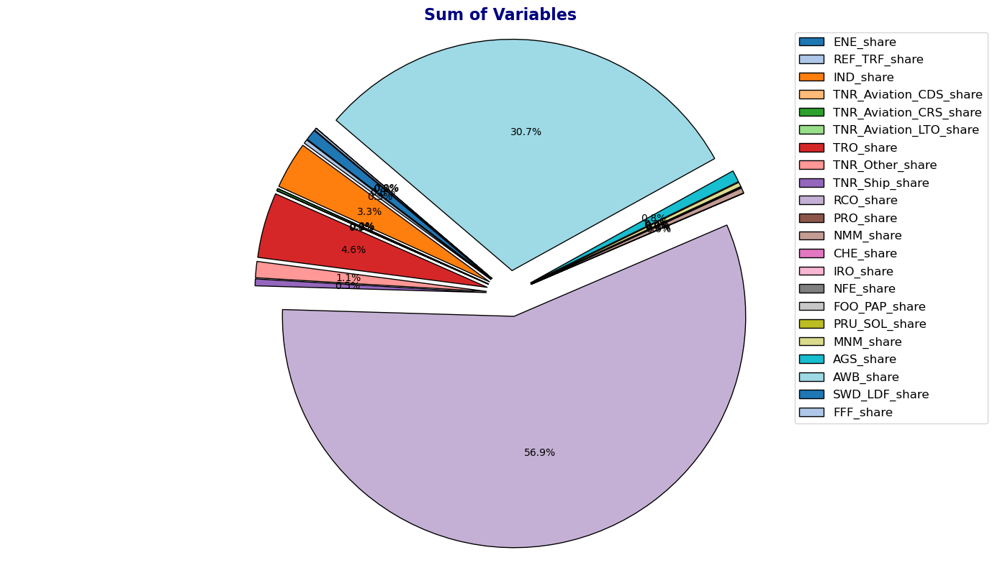

In [131]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels, and add legend
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Create legend with labels
plt.legend(sum_values_df.columns, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


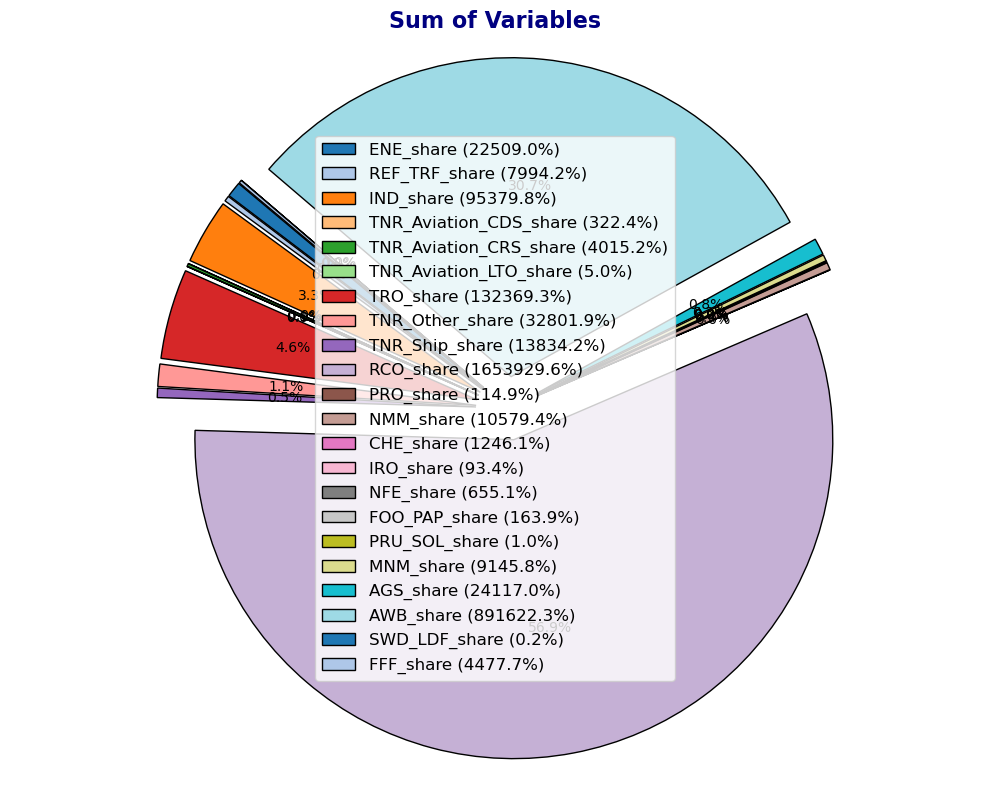

In [123]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(10, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
pie_data = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                   wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Create legend with labels and percentages
legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(sum_values_df.columns, sum_values_df.iloc[0])]
plt.legend(legend_labels, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


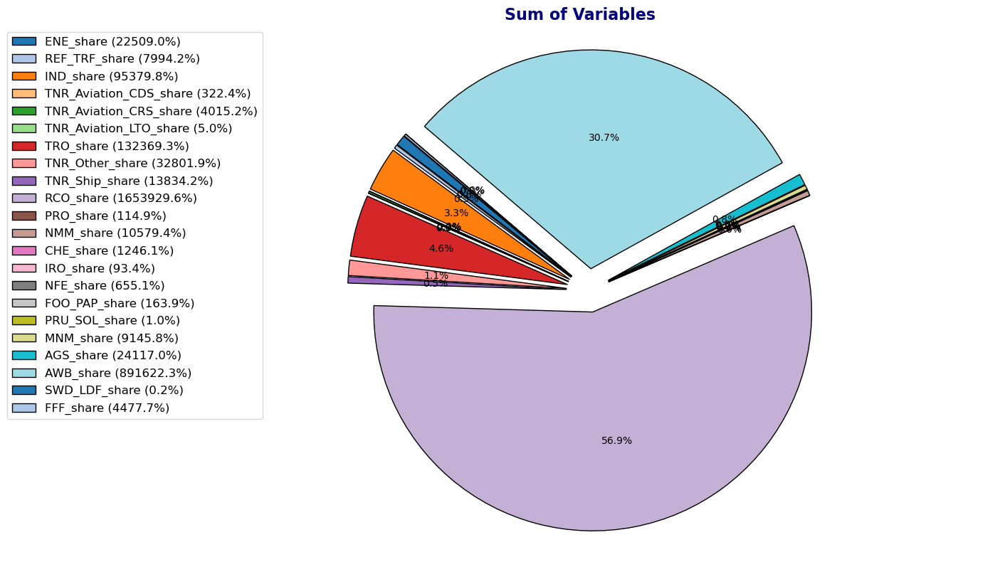

In [127]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
pie_data = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                   wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Create legend with labels and percentages
legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(sum_values_df.columns, sum_values_df.iloc[0])]
plt.legend(legend_labels, loc="upper left", fontsize=12, bbox_to_anchor=(-0.2, 1))

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


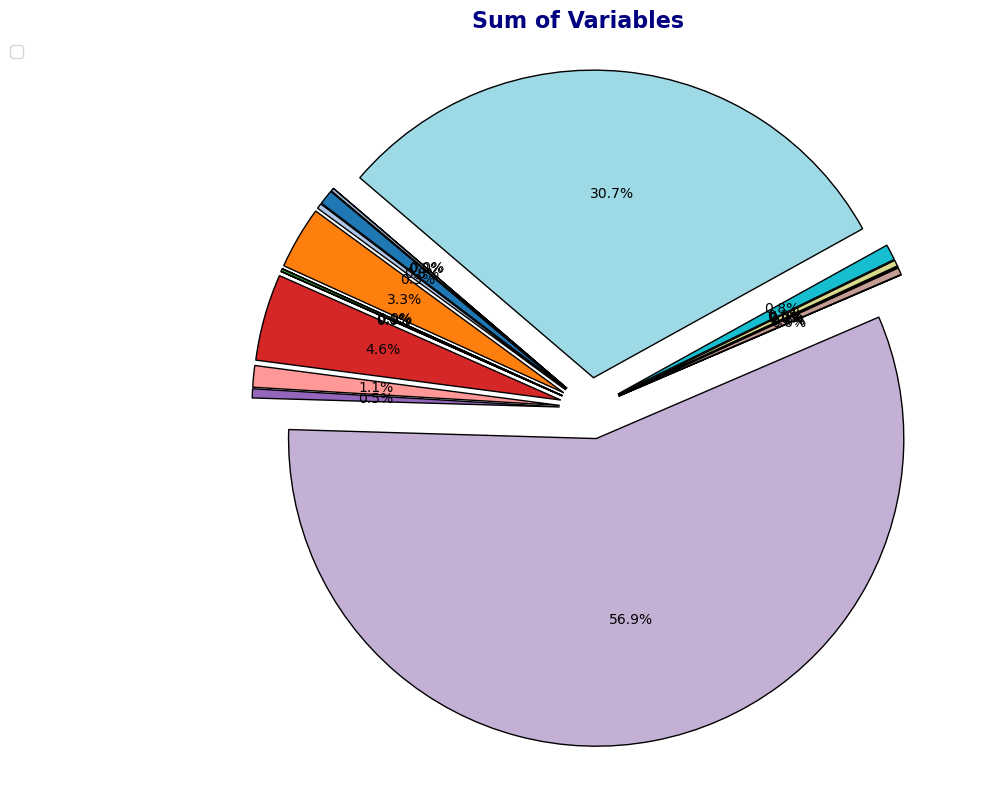

In [130]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(10, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
pie_data = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                   wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Extract percentages from pie chart
percentages = [float(percentage.get_text().strip('%')) for percentage in pie_data[1] if percentage.get_text() != '']

# Create legend with labels and percentages
legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(sum_values_df.columns, percentages)]
plt.legend(legend_labels, loc="upper left", fontsize=12, bbox_to_anchor=(-0.2, 1))

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


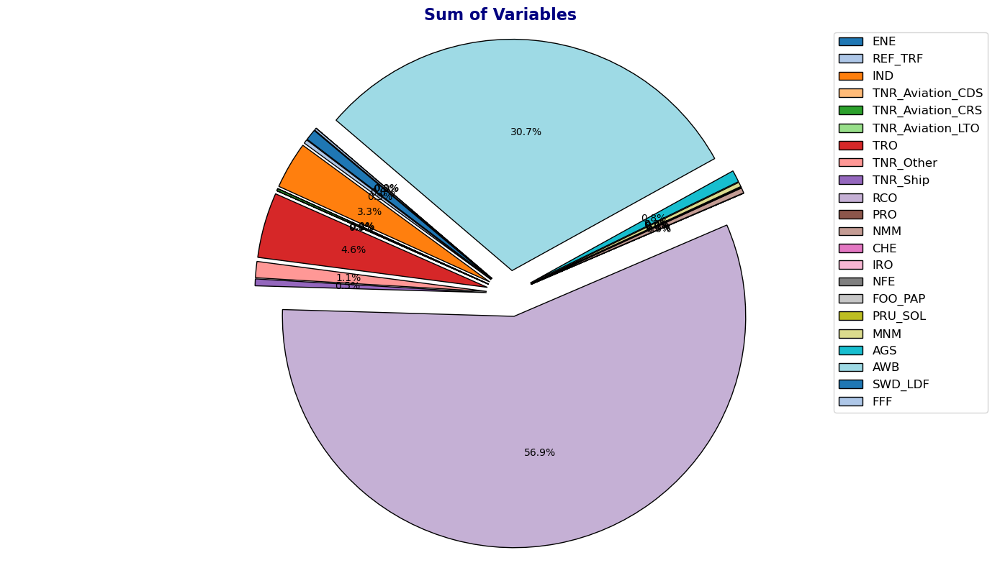

In [133]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Remove "_share" word from legend labels
legend_labels = [label.replace('_share', '') for label in sum_values_df.columns]

# Plot a pie chart without labels, and add legend
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Create legend with modified labels
plt.legend(legend_labels, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


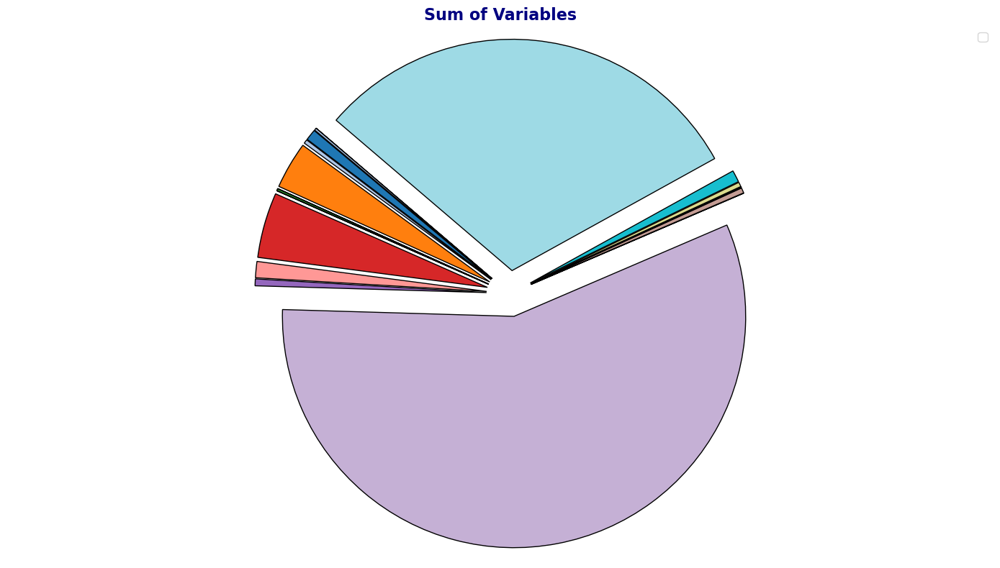

In [135]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches, texts, autotexts = plt.pie(sum_values_df.iloc[0], colors=colors, autopct='', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Extract percentages from pie chart
percentages = [float(autotext.get_text().strip('%')) for autotext in autotexts if autotext.get_text() != '']

# Remove "_share" word from legend labels
legend_labels = [label.replace('_share', '') + f' ({percentage:.1f}%)' for label, percentage in zip(sum_values_df.columns, percentages)]

# Create legend with modified labels
plt.legend(legend_labels, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


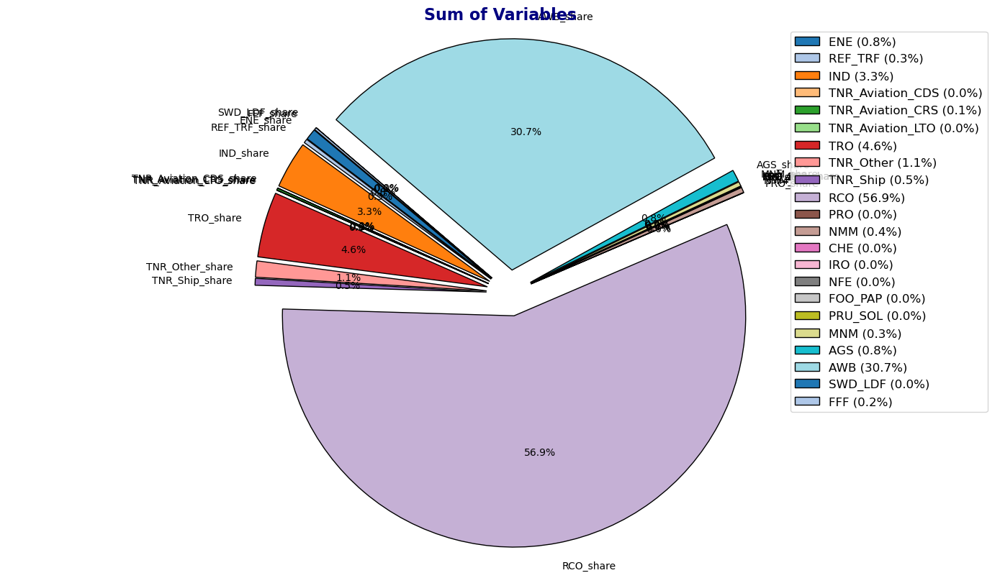

In [137]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches, texts, autotexts = plt.pie(sum_values_df.iloc[0], labels=sum_values_df.columns, colors=colors, autopct='%1.1f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Extract percentages from autopct text
percentages = [float(autotext.get_text().strip('%')) for autotext in autotexts]

# Remove "_share" word from legend labels and add percentages
legend_labels = [f'{label.replace("_share", "")} ({percentage:.1f}%)' for label, percentage in zip(sum_values_df.columns, percentages)]

# Create legend with modified labels
plt.legend(legend_labels, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


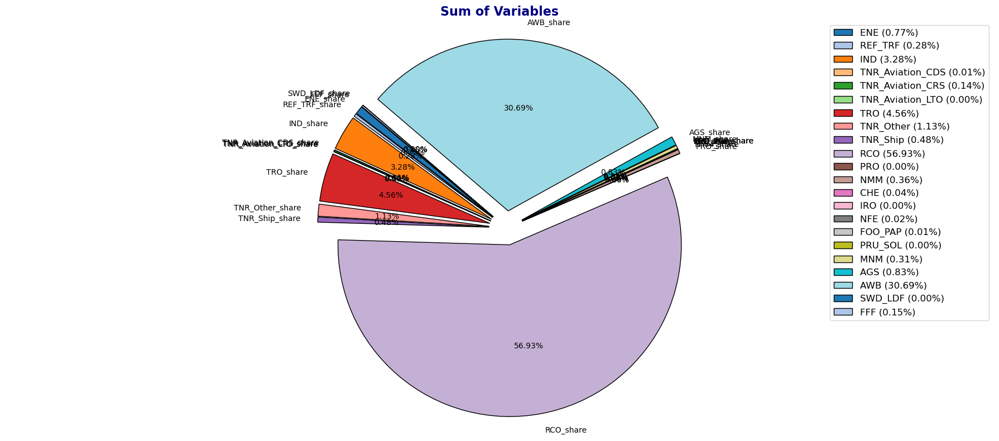

In [140]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(18, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches, texts, autotexts = plt.pie(sum_values_df.iloc[0], labels=sum_values_df.columns, colors=colors, autopct='%1.2f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Extract percentages from autopct text
percentages = [float(autotext.get_text().strip('%')) for autotext in autotexts]

# Remove "_share" word from legend labels and add percentages
legend_labels = [f'{label.replace("_share", "")} ({percentage:.2f}%)' for label, percentage in zip(sum_values_df.columns, percentages)]

# Create legend with modified labels
plt.legend(legend_labels, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


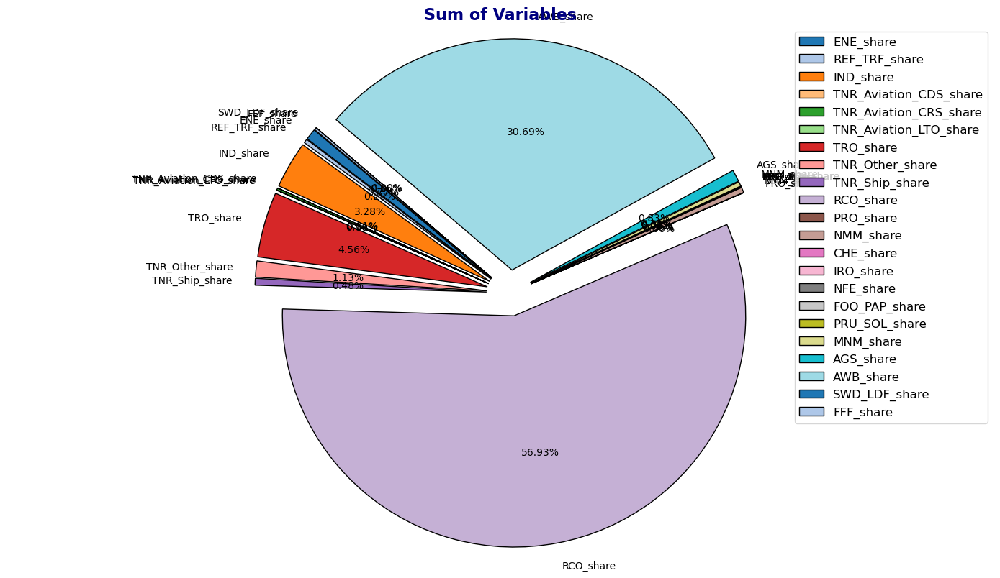

In [139]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Calculate percentages
percentages = sum_values_df.iloc[0] / sum_values_df.iloc[0].sum() * 100

# Filter out variables with non-zero percentages
non_zero_variables = percentages[percentages > 0]

# Plot a pie chart without labels
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(non_zero_variables)  # Explode all slices slightly for emphasis
patches, texts, autotexts = plt.pie(non_zero_variables, labels=non_zero_variables.index, colors=colors, autopct='%1.2f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Create legend with modified labels
plt.legend(non_zero_variables.index, loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


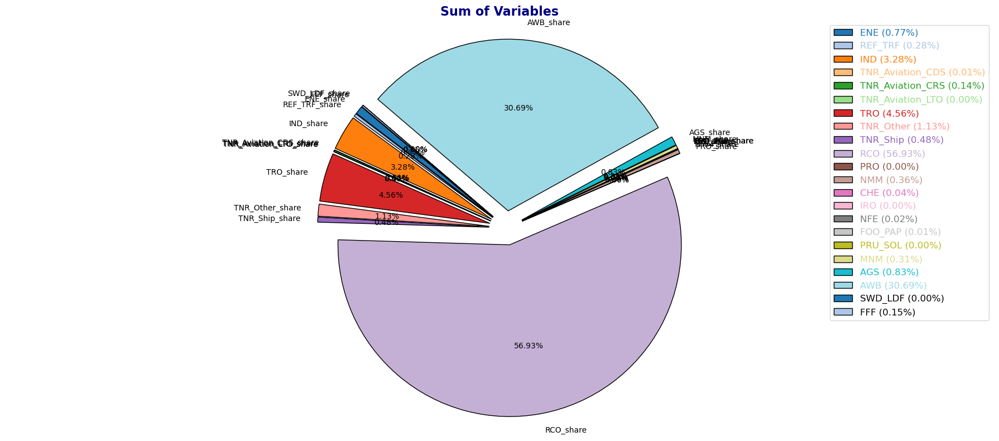

In [141]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the sum_values.csv file
sum_values_df = pd.read_csv(r'G:\#PM25_MODI\csv\sum_values.csv')

# Plot a pie chart without labels
plt.figure(figsize=(18, 8))
colors = plt.cm.tab20.colors  # Using a color map for more visually appealing colors
explode = [0.1] * len(sum_values_df.columns)  # Explode all slices slightly for emphasis
patches, texts, autotexts = plt.pie(sum_values_df.iloc[0], labels=sum_values_df.columns, colors=colors, autopct='%1.2f%%', startangle=140, explode=explode,
                  wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Sum of Variables', fontsize=16, fontweight='bold', color='navy')

# Extract percentages from autopct text
percentages = [float(autotext.get_text().strip('%')) for autotext in autotexts]

# Remove "_share" word from legend labels and add percentages
legend_labels = [f'{label.replace("_share", "")} ({percentage:.2f}%)' for label, percentage in zip(sum_values_df.columns, percentages)]

# Create legend with modified labels
legend = plt.legend(legend_labels, loc="best", fontsize=12)

# Set legend text color to match the corresponding pie slice color
for text, color in zip(legend.get_texts(), colors):
    text.set_color(color)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()
